# tf_idf #

In [ ]:
# prompt: save my csv file in a dataframe

import pandas as pd

# Assuming your CSV file is named 'your_file.csv'
# Replace 'your_file.csv' with the actual filename
try:
  df = pd.read_csv('tf_idf_documentos.csv')
  print("File loaded successfully!")
except FileNotFoundError:
  print("Error: File not found. Please check the filename and ensure it exists in the current directory.")
except pd.errors.EmptyDataError:
  print("Error: The CSV file is empty.")
except pd.errors.ParserError:
  print("Error: There was an issue parsing the CSV file. Please check its format.")
except Exception as e:
  print(f"An unexpected error occurred: {e}")
else:
  # You can now work with the DataFrame 'df'
  print(df.head()) # Print the first few rows to verify
  # ... your further code ...


File loaded successfully!
                                     filename   abarcar   abordar  abstracto  \
0                       184_Ergonomia.txt.txt  0.000000  0.106997        0.0   
1               105_Marketing_Digital.txt.txt  0.000000  0.000000        0.0   
2                   32_Emprendimiento.txt.txt  0.203287  0.000000        0.0   
3  185_Ingenieria_de_la_Calidad_+_Lab.txt.txt  0.000000  0.000000        0.0   
4     24_Aprendizaje_y_Servicio_PASEC.txt.txt  0.000000  0.000000        0.0   

   academica  academico  acceso  accion  activamente  actividad  ...  visita  \
0        0.0   0.000000     0.0     0.0          0.0        0.0  ...     0.0   
1        0.0   0.000000     0.0     0.0          0.0        0.0  ...     0.0   
2        0.0   0.000000     0.0     0.0          0.0        0.0  ...     0.0   
3        0.0   0.000000     0.0     0.0          0.0        0.0  ...     0.0   
4        0.0   0.176344     0.0     0.0          0.0        0.0  ...     0.0   

   vista  vi

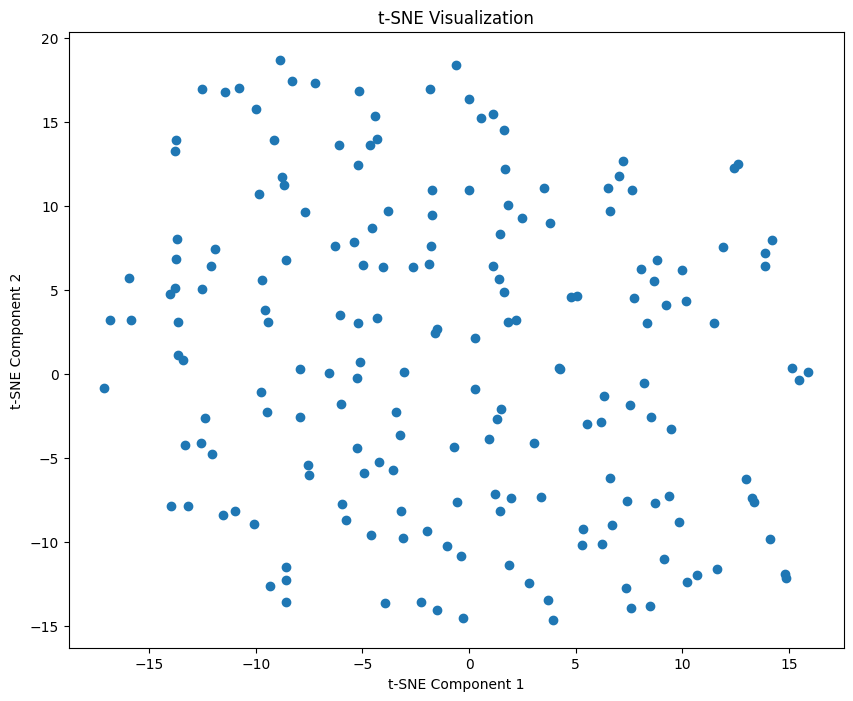

In [ ]:
# prompt: visualize my df with tsne

import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Assuming your data for t-SNE is in columns 1 onwards (exclude the first column if it's an index)
X = df.iloc[:, 1:]  # Adjust the slicing if your data is in different columns


tsne = TSNE(n_components=2, random_state=42)  # Adjust parameters as needed
X_tsne = tsne.fit_transform(X)

plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.title('t-SNE Visualization')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def read_and_prepare_data(file_path, normalization_method='minmax'):
   """
   Read CSV, remove first column, and normalize data

   Args:
       file_path (str): Path to CSV file
       normalization_method (str): 'minmax' or 'standard'

   Returns:
       tuple: Normalized DataFrame, first column
   """
   try:
       # Read CSV file
       df = pd.read_csv(file_path)

       # Extract first column
       first_column = df.iloc[:, 0]

       # Remove first column from DataFrame
       X = df.iloc[:, 1:]

       # Normalize data
       if normalization_method == 'minmax':
           scaler = MinMaxScaler()
           X_normalized = pd.DataFrame(
               scaler.fit_transform(X),
               columns=X.columns
           )
       elif normalization_method == 'standard':
           from sklearn.preprocessing import StandardScaler
           scaler = StandardScaler()
           X_normalized = pd.DataFrame(
               scaler.fit_transform(X),
               columns=X.columns
           )
       else:
           raise ValueError("Invalid normalization method")

       return X_normalized, first_column

   except Exception as e:
       print(f"Error processing data: {e}")
       return None, None

In [ ]:
file_path = 'tf_idf_documentos.csv'
X, first_column = read_and_prepare_data(file_path, 'standard')

# Optional: print DataFrame details
print("DataFrame shape:", X.shape)
print("First column details:", first_column)

DataFrame shape: (186, 1157)
First column details: 0                           184_Ergonomia.txt.txt
1                   105_Marketing_Digital.txt.txt
2                       32_Emprendimiento.txt.txt
3      185_Ingenieria_de_la_Calidad_+_Lab.txt.txt
4         24_Aprendizaje_y_Servicio_PASEC.txt.txt
                          ...                    
181                  139_Taller_de_Arte_3.txt.txt
182                 33_Diseño_de_Sistemas.txt.txt
183      141_Temas_en_Comunicacion_y_Arte.txt.txt
184    124_Teoria_Critica_1__Arte_&_Media.txt.txt
185                 158_Teoria_de_Numeros.txt.txt
Name: filename, Length: 186, dtype: object


In [ ]:
import os
import pandas as pd
from sklearn.manifold import TSNE, Isomap
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import numpy as np
from itertools import product
import math

def run_isomap_with_tsne(X_scaled, param_grid, first_column):
    """Run Isomap with multiple parameter combinations, plot reduced space with t-SNE, and save results."""
    results = []
    min_error = float('inf')  # Track the minimum reconstruction error
    best_idx = None           # Track the index of the best parameter combination

    # Folder for saving CSVs
    output_folder = "Isomap_2"
    os.makedirs(output_folder, exist_ok=True)

    # Get the total number of parameter combinations
    param_combinations = list(product(param_grid['n_components'], param_grid['n_neighbors']))
    num_combinations = len(param_combinations)

    # Create a grid of subplots
    cols = 3  # Number of columns
    rows = math.ceil(num_combinations / cols)  # Number of rows
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = axes.flatten()  # Flatten axes for easy iteration

    for idx, (n_components, n_neighbors) in enumerate(param_combinations):
        try:
            print(f"Running Isomap with n_components={n_components}, n_neighbors={n_neighbors}")

            # Validate parameters
            if n_components > X_scaled.shape[1]:
                print(f"Skipping n_components={n_components}: exceeds feature dimensions.")
                continue
            if n_neighbors >= X_scaled.shape[0]:
                print(f"Skipping n_neighbors={n_neighbors}: exceeds number of data points.")
                continue

            # Run Isomap
            isomap = Isomap(n_components=n_components, n_neighbors=n_neighbors, n_jobs=-1)
            transformed_data = isomap.fit_transform(X_scaled)

            # Calculate reconstruction error
            original_distances = pairwise_distances(X_scaled)
            reduced_distances = pairwise_distances(transformed_data)
            reconstruction_error = np.mean((original_distances - reduced_distances) ** 2)

            # Update the best error and index
            if reconstruction_error < min_error:
                min_error = reconstruction_error
                best_idx = idx

            # Create DataFrame with first column
            output_df = pd.DataFrame(transformed_data)
            output_df.insert(0, 'original_column', first_column)

            # Save the reduced space to a CSV file
            file_name = f"isomap_ncomp{n_components}_nneigh{n_neighbors}_error{reconstruction_error:.4f}.csv"
            file_path = os.path.join(output_folder, file_name)
            output_df.to_csv(file_path, index=False)
            print(f"Saved Isomap result to {file_path}")

            # Apply t-SNE on the Isomap-transformed data
            tsne = TSNE(n_components=2, random_state=42)
            tsne_result = tsne.fit_transform(transformed_data)

            # Plot the reduced space in the corresponding subplot
            ax = axes[idx]
            ax.scatter(tsne_result[:, 0], tsne_result[:, 1], c='blue', alpha=0.6, edgecolors='k')
            ax.set_title(f"n_components={n_components}, n_neighbors={n_neighbors}\nMSE: {reconstruction_error:.4f}")
            ax.set_xlabel("t-SNE Dimension 1")
            ax.set_ylabel("t-SNE Dimension 2")
            ax.grid(True)

            # Store results
            results.append({
                'params': {'n_components': n_components, 'n_neighbors': n_neighbors},
                'transformed_data': transformed_data,
                'reconstruction_error': reconstruction_error
            })

        except ValueError as ve:
            print(f"ValueError for n_components={n_components}, n_neighbors={n_neighbors}: {str(ve)}")
        except Exception as e:
            print(f"Unexpected error for n_components={n_components}, n_neighbors={n_neighbors}: {str(e)}")

    # Highlight the best subplot
    if best_idx is not None:
        axes[best_idx].set_title(
            axes[best_idx].get_title(),
            fontweight='bold',
            color='red'
        )

    # Remove empty subplots
    for i in range(len(param_combinations), len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

    return results


In [ ]:
!pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.7 MB/s eta 0:00:00


Running Isomap with n_components=2, n_neighbors=10
Saved Isomap result to Isomap/isomap_ncomp2_nneigh10_error1281.5394.csv
Running Isomap with n_components=2, n_neighbors=20
Saved Isomap result to Isomap/isomap_ncomp2_nneigh20_error1222.7893.csv
Running Isomap with n_components=2, n_neighbors=30
Saved Isomap result to Isomap/isomap_ncomp2_nneigh30_error1211.0101.csv
Running Isomap with n_components=2, n_neighbors=40
Saved Isomap result to Isomap/isomap_ncomp2_nneigh40_error1161.1026.csv
Running Isomap with n_components=2, n_neighbors=50
Saved Isomap result to Isomap/isomap_ncomp2_nneigh50_error1217.1838.csv
Running Isomap with n_components=2, n_neighbors=60
Saved Isomap result to Isomap/isomap_ncomp2_nneigh60_error1124.3917.csv
Running Isomap with n_components=3, n_neighbors=10
Saved Isomap result to Isomap/isomap_ncomp3_nneigh10_error1092.4912.csv
Running Isomap with n_components=3, n_neighbors=20
Saved Isomap result to Isomap/isomap_ncomp3_nneigh20_error1009.9731.csv
Running Isomap w

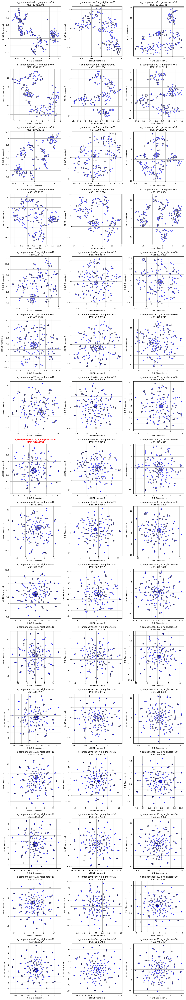

In [ ]:
param_grid = {'n_components': [2, 3, 10, 20, 30, 40, 50, 60], 'n_neighbors': [10, 20, 30, 40, 50, 60]}
results = run_isomap_with_tsne(X, param_grid, first_column)

# Display reconstruction errors
for result in results:
    print(f"Params: {result['params']}, Reconstruction Error: {result['reconstruction_error']}")


In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from itertools import product
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from keras.models import Model
from keras.layers import Input, Dense, Dropout
from keras import regularizers
import math

def build_autoencoder(X_scaled, params):
    """Build autoencoder with given parameters."""
    input_dim = X_scaled.shape[1]
    input_layer = Input(shape=(input_dim,))

    # Encoder
    if params['type'] == 'sparse':
        encoded = Dense(params['encoding_dim'], activation='relu',
                        activity_regularizer=regularizers.l1(params['parameter']))(input_layer)
    else:  # denoising
        encoded = Dense(params['encoding_dim'], activation='relu')(
            Dropout(params['parameter'])(input_layer))

    # Decoder
    decoded = Dense(input_dim, activation='sigmoid')(encoded)

    autoencoder = Model(input_layer, decoded)
    autoencoder.compile(optimizer='adam', loss='mse')

    return autoencoder

def run_autoencoder(X_scaled, params):
    """Run autoencoder with given parameters."""
    try:
        # Split data without labels
        X_train, X_test = train_test_split(
            X_scaled, test_size=0.2, random_state=42)

        # Build and train autoencoder
        autoencoder = build_autoencoder(X_scaled, params)
        history = autoencoder.fit(
            X_train, X_train,
            epochs=150,
            batch_size=32,
            validation_split=0.2,
            verbose=0
        )

        # Get latent space
        encoder = Model(autoencoder.input, autoencoder.layers[1].output)
        latent_space = encoder.predict(X_scaled)

        # Calculate reconstruction error
        reconstructed = autoencoder.predict(X_scaled)
        reconstruction_error = np.mean((X_scaled - reconstructed) ** 2)

        return {
            'params': params,
            'history': history.history,
            'latent_space': latent_space,
            'reconstruction_error': reconstruction_error
        }
    except Exception as e:
        print(f"Error in Autoencoder with params {params}: {str(e)}")
        return None

def run_autoencoders_with_tsne(X_scaled, param_grid, first_column):
    """Run autoencoders with multiple parameter combinations and plot results with t-SNE."""
    results = []
    min_error = float('inf')  # Track the minimum reconstruction error
    best_idx = None           # Track the index of the best parameter combination

    if param_grid['type'][0] == 'sparse':
        # Get the total number of parameter combinations
        param_combinations = list(product(
            param_grid['type'],
            param_grid['encoding_dim'],
            param_grid['sparsity']
        ))
    else:
        param_combinations = list(product(
            param_grid['type'],
            param_grid['encoding_dim'],
            param_grid['dropout_rate']
        ))
    num_combinations = len(param_combinations)

    # Create a grid of subplots
    cols = 3  # Number of columns
    rows = math.ceil(num_combinations / cols)  # Number of rows
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = axes.flatten()  # Flatten axes for easy iteration

    for idx, (ae_type, encoding_dim, parameter) in enumerate(param_combinations):
        try:
            print(f"Running Autoencoder with type={ae_type}, encoding_dim={encoding_dim}, parameter={parameter}")

            params = {
                'type': ae_type,
                'encoding_dim': encoding_dim,
                'parameter': parameter
            }

            # Build and train the autoencoder
            result = run_autoencoder(X_scaled, params)
            if result is None:
                continue

            latent_space = result['latent_space']
            reconstruction_error = result['reconstruction_error']

            # Update the best error and index
            if reconstruction_error < min_error:
                min_error = reconstruction_error
                best_idx = idx

            # Save latent space to CSV
            output_folder = "Autoencoders_2"
            os.makedirs(output_folder, exist_ok=True)

            # Create DataFrame with first column
            output_df = pd.DataFrame(latent_space)
            output_df.insert(0, 'original_column', first_column)

            file_name = f"autoencoder_type{ae_type}_dim{encoding_dim}_param{parameter}_error{reconstruction_error:.4f}.csv"
            file_path = os.path.join(output_folder, file_name)
            pd.DataFrame(output_df).to_csv(file_path, index=False)
            print(f"Saved latent space to {file_path}")

            # Reduce latent space to 2D with t-SNE
            tsne = TSNE(n_components=2, random_state=42)
            tsne_result = tsne.fit_transform(latent_space)

            # Plot the reduced latent space
            ax = axes[idx]
            ax.scatter(tsne_result[:, 0], tsne_result[:, 1], c='blue', alpha=0.6, edgecolors='k')
            if ae_type == 'sparse':
                ax.set_title(f"type={ae_type}, dim={encoding_dim}, sparsity={parameter}\nMSE: {reconstruction_error:.4f}")
            else:
                ax.set_title(f"type={ae_type}, dim={encoding_dim}, dropout_rate = {parameter}\nMSE: {reconstruction_error:.4f}")
            ax.set_xlabel("t-SNE Dimension 1")
            ax.set_ylabel("t-SNE Dimension 2")
            ax.grid(True)

            # Store results
            results.append({
                'params': params,
                'reconstruction_error': reconstruction_error
            })

        except Exception as e:
            print(f"Error for type={ae_type}, dim={encoding_dim}: {str(e)}")

    # Highlight the best subplot
    if best_idx is not None:
        axes[best_idx].set_title(
            axes[best_idx].get_title(),
            fontweight='bold',
            color='red'
        )

    # Remove empty subplots
    for i in range(len(param_combinations), len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

    return results


Running Autoencoder with type=sparse, encoding_dim=2, parameter=0.0001
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Saved latent space to Autoencoders/autoencoder_typesparse_dim2_param0.0001_error1.0670.csv
Running Autoencoder with type=sparse, encoding_dim=2, parameter=1e-05


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Saved latent space to Autoencoders/autoencoder_typesparse_dim2_param1e-05_error1.0662.csv
Running Autoencoder with type=sparse, encoding_dim=2, parameter=1e-06
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Saved latent space to Autoencoders/autoencoder_typesparse_dim2_param1e-06_error1.0694.csv
Running Autoencoder with type=sparse, encoding_dim=2, parameter=1e-07
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Saved latent space to Autoencoders/autoencoder_typesparse_dim2_param1e-07_error1.0618.csv
Running Autoencoder with type=sparse, encoding_dim=3, parameter=0.0001
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Saved latent space to Autoencoders/autoencoder_typesparse_dim3_param0.0001_error1.0535.csv
Running Autoencoder with type=sparse, encoding_dim=3, parameter=1e-05
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Saved latent spa

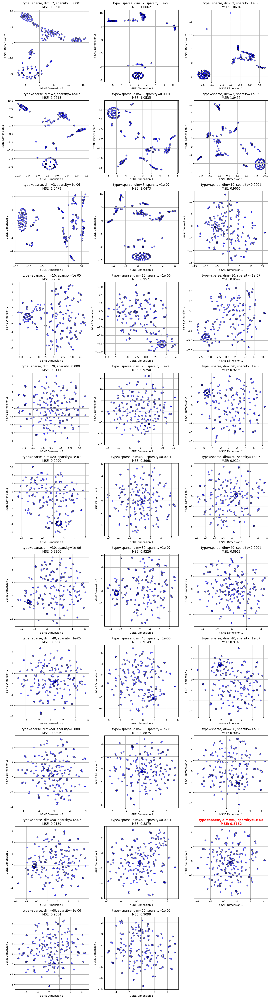

Running Autoencoder with type=denoising, encoding_dim=2, parameter=0.1
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Saved latent space to Autoencoders/autoencoder_typedenoising_dim2_param0.1_error1.0598.csv
Running Autoencoder with type=denoising, encoding_dim=2, parameter=0.2
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Saved latent space to Autoencoders/autoencoder_typedenoising_dim2_param0.2_error1.0581.csv
Running Autoencoder with type=denoising, encoding_dim=2, parameter=0.3
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Saved latent space to Autoencoders/autoencoder_typedenoising_dim2_param0.3_error1.0595.csv
Running Autoencoder with type=denoising, encoding_dim=2, parameter=0.4
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Saved latent space to Autoencoders/autoencoder_typedenoising_dim2_param0.4_error1.0606.csv
Running Autoencoder with type=denoising, encodin

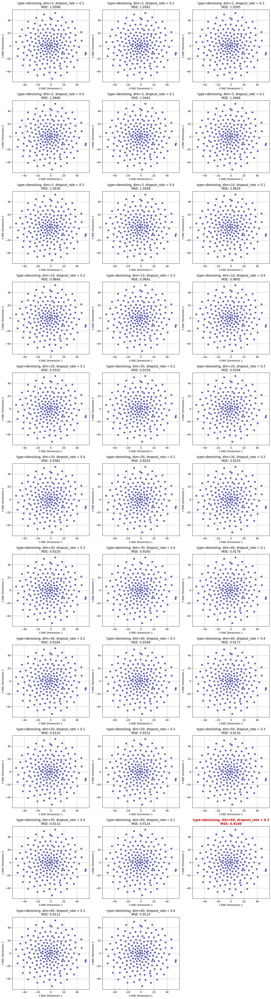

In [ ]:
param_grid_sparse = {
    'type': ['sparse'],
    'encoding_dim': [2, 3, 10, 20, 30, 40, 50, 60],
    'sparsity': [1e-4, 1e-5, 1e-6, 1e-7]  # Only used for sparse autoencoder
}

param_grid_denoising = {
    'type': ['denoising'],
    'encoding_dim': [2, 3, 10, 20, 30, 40, 50, 60],
    'dropout_rate': [0.1, 0.2, 0.3, 0.4]  # Only used for denoising autoencoder
}

# Run the function
results_sparse = run_autoencoders_with_tsne(X, param_grid_sparse, first_column)
results_denoising = run_autoencoders_with_tsne(X, param_grid_denoising, first_column)


In [ ]:
import umap
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances
from itertools import product
import math

def run_umap_with_tsne(X_scaled, param_grid, first_column):
    """Run UMAP with different parameter combinations and plot reduced space with t-SNE."""
    results = []
    min_error = float('inf')  # Track the minimum reconstruction error
    best_idx = None           # Track the index of the best parameter combination

    # Folder for saving CSVs
    output_folder = "Umap_2"
    os.makedirs(output_folder, exist_ok=True)

    # Get the total number of parameter combinations
    param_combinations = list(product(
        param_grid['n_components'],
        param_grid['n_neighbors'],
        param_grid['min_dist'],
        param_grid['metric']
    ))
    num_combinations = len(param_combinations)

    # Create a grid of subplots
    cols = 3  # Number of columns
    rows = math.ceil(num_combinations / cols)  # Number of rows
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = axes.flatten()  # Flatten axes for easy iteration

    # Iterate through each combination of n_components, n_neighbors, and min_dist
    for idx, (n_components, n_neighbors, min_dist, metric) in enumerate(param_combinations):
        try:
            print(f"Running UMAP with n_components={n_components}, n_neighbors={n_neighbors}, min_dist={min_dist}, metric={metric}")

            # Validate parameters
            if n_components > X_scaled.shape[1]:
                print(f"Skipping n_components={n_components}: exceeds feature dimensions.")
                continue
            if n_neighbors >= X_scaled.shape[0]:
                print(f"Skipping n_neighbors={n_neighbors}: exceeds number of data points.")
                continue

            # Run UMAP with the new parameter
            umap_model = umap.UMAP(
                n_neighbors=n_neighbors,
                n_components=n_components,
                min_dist=min_dist,
                metric=metric,
                random_state=42
            )
            umap_transformed_data = umap_model.fit_transform(X_scaled)

            # Apply t-SNE on the UMAP-transformed data
            tsne = TSNE(n_components=2, random_state=42)
            tsne_result = tsne.fit_transform(umap_transformed_data)

            # Calculate reconstruction error (using pairwise distance as a proxy)
            original_distances = pairwise_distances(X_scaled)
            reduced_distances = pairwise_distances(umap_transformed_data)
            reconstruction_error = np.mean((original_distances - reduced_distances) ** 2)

            # Update the best error and index
            if reconstruction_error < min_error:
                min_error = reconstruction_error
                best_idx = idx

            # Create DataFrame with first column
            output_df = pd.DataFrame(umap_transformed_data)
            output_df.insert(0, 'original_column', first_column)

            # Save the reduced space to a CSV file
            file_name = f"umap_ncomp{n_components}_nneigh{n_neighbors}_mindist{min_dist}_metric{metric}_error{reconstruction_error:.4f}.csv"
            file_path = os.path.join(output_folder, file_name)
            pd.DataFrame(output_df).to_csv(file_path, index=False)
            print(f"Saved Umap result to {file_path}")

            # Plot the reduced space in the corresponding subplot
            ax = axes[idx]
            ax.scatter(tsne_result[:, 0], tsne_result[:, 1], c='blue', alpha=0.6, edgecolors='k')
            ax.set_title(f"n_components={n_components}, n_neighbors={n_neighbors}, min_dist={min_dist}, metric={metric}\nError: {reconstruction_error:.4f}")
            ax.set_xlabel("t-SNE Dimension 1")
            ax.set_ylabel("t-SNE Dimension 2")
            ax.grid(True)

            # Store results
            results.append({
                'params': {'n_components': n_components, 'n_neighbors': n_neighbors, 'min_dist': min_dist, 'metric': metric},
                'transformed_data': umap_transformed_data,
                'reconstruction_error': reconstruction_error
            })


        except ValueError as ve:
            print(f"ValueError for n_components={n_components}, n_neighbors={n_neighbors}, min_dist={min_dist}: {str(ve)}")
        except Exception as e:
            print(f"Unexpected error for n_components={n_components}, n_neighbors={n_neighbors}, min_dist={min_dist}: {str(e)}")

    # Highlight the best subplot
    if best_idx is not None:
        axes[best_idx].set_title(
            axes[best_idx].get_title(),
            fontweight='bold',
            color='red'
        )

    # Remove empty subplots
    for i in range(len(param_combinations), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

    return results


Running UMAP with n_components=2, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh20_mindist0.1_metriceuclidean_error2153.5440.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh20_mindist0.1_metriccosine_error2099.7808.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh20_mindist0.3_metriceuclidean_error2125.6594.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh20_mindist0.3_metriccosine_error2069.4793.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh20_mindist0.7_metriceuclidean_error2073.3507.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh20_mindist0.7_metriccosine_error2006.8442.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh40_mindist0.1_metriceuclidean_error2160.5208.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh40_mindist0.1_metriccosine_error2120.5143.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh40_mindist0.3_metriceuclidean_error2129.5832.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh40_mindist0.3_metriccosine_error2092.7174.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh40_mindist0.7_metriceuclidean_error2081.7119.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh40_mindist0.7_metriccosine_error2032.0885.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh60_mindist0.1_metriceuclidean_error2154.5238.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh60_mindist0.1_metriccosine_error2128.5382.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh60_mindist0.3_metriceuclidean_error2131.0904.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh60_mindist0.3_metriccosine_error2100.1905.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh60_mindist0.7_metriceuclidean_error2080.4018.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp2_nneigh60_mindist0.7_metriccosine_error2043.4768.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh20_mindist0.1_metriceuclidean_error2164.0863.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh20_mindist0.1_metriccosine_error2123.2452.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh20_mindist0.3_metriceuclidean_error2139.1232.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh20_mindist0.3_metriccosine_error2097.4207.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh20_mindist0.7_metriceuclidean_error2092.5785.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh20_mindist0.7_metriccosine_error2048.9006.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh40_mindist0.1_metriceuclidean_error2166.3351.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh40_mindist0.1_metriccosine_error2143.3177.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh40_mindist0.3_metriceuclidean_error2142.6146.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh40_mindist0.3_metriccosine_error2117.5381.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh40_mindist0.7_metriceuclidean_error2095.9715.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh40_mindist0.7_metriccosine_error2065.4865.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh60_mindist0.1_metriceuclidean_error2167.9383.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh60_mindist0.1_metriccosine_error2148.2006.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh60_mindist0.3_metriceuclidean_error2143.3914.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh60_mindist0.3_metriccosine_error2123.4796.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh60_mindist0.7_metriceuclidean_error2096.6314.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp3_nneigh60_mindist0.7_metriccosine_error2073.3621.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh20_mindist0.1_metriceuclidean_error2172.6273.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh20_mindist0.1_metriccosine_error2136.7656.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh20_mindist0.3_metriceuclidean_error2150.5584.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh20_mindist0.3_metriccosine_error2116.0726.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh20_mindist0.7_metriceuclidean_error2107.9559.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh20_mindist0.7_metriccosine_error2073.7156.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh40_mindist0.1_metriceuclidean_error2175.4777.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh40_mindist0.1_metriccosine_error2154.9126.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh40_mindist0.3_metriceuclidean_error2153.5286.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh40_mindist0.3_metriccosine_error2132.7361.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh40_mindist0.7_metriceuclidean_error2112.7010.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh40_mindist0.7_metriccosine_error2088.9906.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh60_mindist0.1_metriceuclidean_error2176.1466.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh60_mindist0.1_metriccosine_error2162.0034.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh60_mindist0.3_metriceuclidean_error2154.1021.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh60_mindist0.3_metriccosine_error2139.7489.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh60_mindist0.7_metriceuclidean_error2113.6238.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp5_nneigh60_mindist0.7_metriccosine_error2095.9117.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh20_mindist0.1_metriceuclidean_error2177.4754.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh20_mindist0.1_metriccosine_error2139.0542.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh20_mindist0.3_metriceuclidean_error2157.4235.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh20_mindist0.3_metriccosine_error2121.6151.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh20_mindist0.7_metriceuclidean_error2118.4880.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh20_mindist0.7_metriccosine_error2085.3185.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh40_mindist0.1_metriceuclidean_error2180.6322.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh40_mindist0.1_metriccosine_error2157.7992.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh40_mindist0.3_metriceuclidean_error2160.2803.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh40_mindist0.3_metriccosine_error2138.2449.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh40_mindist0.7_metriceuclidean_error2120.8062.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh40_mindist0.7_metriccosine_error2100.0577.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh60_mindist0.1_metriceuclidean_error2181.6299.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh60_mindist0.1_metriccosine_error2166.2195.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh60_mindist0.3_metriceuclidean_error2161.1704.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh60_mindist0.3_metriccosine_error2145.8812.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh60_mindist0.7_metriceuclidean_error2121.9695.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp10_nneigh60_mindist0.7_metriccosine_error2106.7448.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh20_mindist0.1_metriceuclidean_error2179.1380.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh20_mindist0.1_metriccosine_error2138.5076.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh20_mindist0.3_metriceuclidean_error2159.6314.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh20_mindist0.3_metriccosine_error2121.2797.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh20_mindist0.7_metriceuclidean_error2121.6286.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh20_mindist0.7_metriccosine_error2086.1351.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh40_mindist0.1_metriceuclidean_error2182.2721.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh40_mindist0.1_metriccosine_error2157.6865.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh40_mindist0.3_metriceuclidean_error2162.2937.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh40_mindist0.3_metriccosine_error2138.4111.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh40_mindist0.7_metriceuclidean_error2124.1883.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh40_mindist0.7_metriccosine_error2101.5153.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh60_mindist0.1_metriceuclidean_error2183.1583.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh60_mindist0.1_metriccosine_error2165.7829.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh60_mindist0.3_metriceuclidean_error2163.2814.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh60_mindist0.3_metriccosine_error2146.1795.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh60_mindist0.7_metriceuclidean_error2125.1202.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap/umap_ncomp20_nneigh60_mindist0.7_metriccosine_error2108.8669.csv


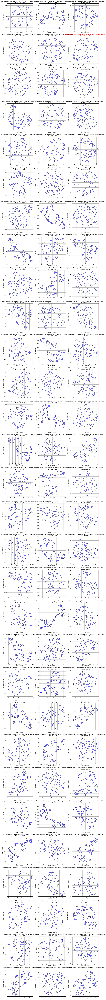

In [ ]:
# Example of how to call the function with a parameter grid
param_grid = {
    'n_components': [2, 3, 5, 10, 20],
    'n_neighbors': [20, 40, 60],
    'min_dist': [0.1, 0.3, 0.7],
    'metric': ['euclidean', 'cosine']
}

# Run the function
results = run_umap_with_tsne(X, param_grid, first_column)


# tf_idf_2 #

In [ ]:
# prompt: save my csv file in a dataframe

import pandas as pd

# Assuming your CSV file is named 'your_file.csv'
# Replace 'your_file.csv' with the actual filename
try:
  df = pd.read_csv('tf_idf_documentos_2.csv')
  print("File loaded successfully!")
except FileNotFoundError:
  print("Error: File not found. Please check the filename and ensure it exists in the current directory.")
except pd.errors.EmptyDataError:
  print("Error: The CSV file is empty.")
except pd.errors.ParserError:
  print("Error: There was an issue parsing the CSV file. Please check its format.")
except Exception as e:
  print(f"An unexpected error occurred: {e}")
else:
  # You can now work with the DataFrame 'df'
  print(df.head()) # Print the first few rows to verify
  # ... your further code ...

File loaded successfully!
                                     filename   abarcar  abordar  abstracto  \
0                       184_Ergonomia.txt.txt  0.000000  1.28818        0.0   
1               105_Marketing_Digital.txt.txt  0.000000  0.00000        0.0   
2                   32_Emprendimiento.txt.txt  2.661306  0.00000        0.0   
3  185_Ingenieria_de_la_Calidad_+_Lab.txt.txt  0.000000  0.00000        0.0   
4     24_Aprendizaje_y_Servicio_PASEC.txt.txt  0.000000  0.00000        0.0   

   academica  academico  acceso  accion  activamente  actividad  ...  visita  \
0        0.0   0.000000     0.0     0.0          0.0        0.0  ...     0.0   
1        0.0   0.000000     0.0     0.0          0.0        0.0  ...     0.0   
2        0.0   0.000000     0.0     0.0          0.0        0.0  ...     0.0   
3        0.0   0.000000     0.0     0.0          0.0        0.0  ...     0.0   
4        0.0   2.026181     0.0     0.0          0.0        0.0  ...     0.0   

   vista  visual  

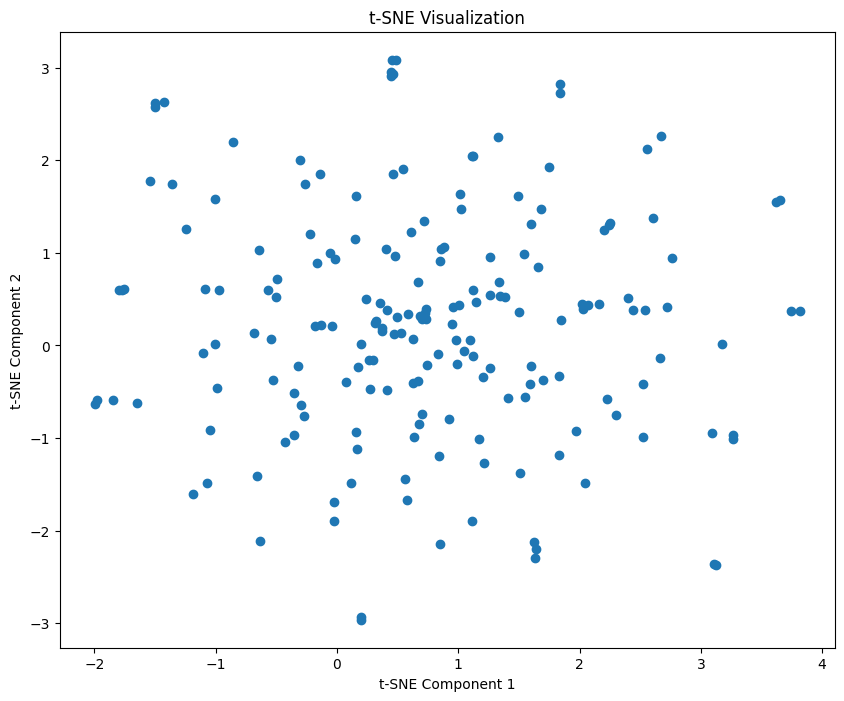

In [ ]:
# prompt: visualize my df with tsne

import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Assuming your data for t-SNE is in columns 1 onwards (exclude the first column if it's an index)
X = df.iloc[:, 1:]  # Adjust the slicing if your data is in different columns


tsne = TSNE(n_components=2, random_state=42)  # Adjust parameters as needed
X_tsne = tsne.fit_transform(X)

plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.title('t-SNE Visualization')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
file_path = 'tf_idf_documentos_2.csv'
X, first_column = read_and_prepare_data(file_path, 'standard')

# Optional: print DataFrame details
print("DataFrame shape:", X.shape)
print("First column details:", first_column)

DataFrame shape: (186, 1157)
First column details: 0                           184_Ergonomia.txt.txt
1                   105_Marketing_Digital.txt.txt
2                       32_Emprendimiento.txt.txt
3      185_Ingenieria_de_la_Calidad_+_Lab.txt.txt
4         24_Aprendizaje_y_Servicio_PASEC.txt.txt
                          ...                    
181                  139_Taller_de_Arte_3.txt.txt
182                 33_Diseño_de_Sistemas.txt.txt
183      141_Temas_en_Comunicacion_y_Arte.txt.txt
184    124_Teoria_Critica_1__Arte_&_Media.txt.txt
185                 158_Teoria_de_Numeros.txt.txt
Name: filename, Length: 186, dtype: object


Running Isomap with n_components=2, n_neighbors=10
Saved Isomap result to Isomap_2/isomap_ncomp2_nneigh10_error1748.9735.csv
Running Isomap with n_components=2, n_neighbors=20
Saved Isomap result to Isomap_2/isomap_ncomp2_nneigh20_error1516.9443.csv
Running Isomap with n_components=2, n_neighbors=30
Saved Isomap result to Isomap_2/isomap_ncomp2_nneigh30_error1476.9733.csv
Running Isomap with n_components=2, n_neighbors=40
Saved Isomap result to Isomap_2/isomap_ncomp2_nneigh40_error1423.4961.csv
Running Isomap with n_components=2, n_neighbors=50
Saved Isomap result to Isomap_2/isomap_ncomp2_nneigh50_error1445.3210.csv
Running Isomap with n_components=2, n_neighbors=60
Saved Isomap result to Isomap_2/isomap_ncomp2_nneigh60_error1321.5346.csv
Running Isomap with n_components=3, n_neighbors=10
Saved Isomap result to Isomap_2/isomap_ncomp3_nneigh10_error1513.6793.csv
Running Isomap with n_components=3, n_neighbors=20
Saved Isomap result to Isomap_2/isomap_ncomp3_nneigh20_error1265.4878.csv


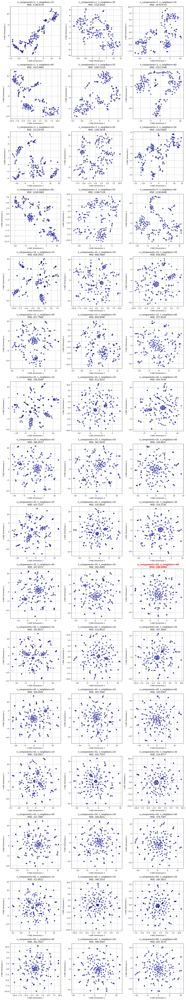

Params: {'n_components': 2, 'n_neighbors': 10}, Reconstruction Error: 1748.9735224476017
Params: {'n_components': 2, 'n_neighbors': 20}, Reconstruction Error: 1516.944253976848
Params: {'n_components': 2, 'n_neighbors': 30}, Reconstruction Error: 1476.97332170962
Params: {'n_components': 2, 'n_neighbors': 40}, Reconstruction Error: 1423.4961024821632
Params: {'n_components': 2, 'n_neighbors': 50}, Reconstruction Error: 1445.3210182967364
Params: {'n_components': 2, 'n_neighbors': 60}, Reconstruction Error: 1321.5346176378332
Params: {'n_components': 3, 'n_neighbors': 10}, Reconstruction Error: 1513.6793206575455
Params: {'n_components': 3, 'n_neighbors': 20}, Reconstruction Error: 1265.4877738614066
Params: {'n_components': 3, 'n_neighbors': 30}, Reconstruction Error: 1242.8462399450332
Params: {'n_components': 3, 'n_neighbors': 40}, Reconstruction Error: 1226.0663187643045
Params: {'n_components': 3, 'n_neighbors': 50}, Reconstruction Error: 1196.7134007723923
Params: {'n_components':

In [ ]:
param_grid = {'n_components': [2, 3, 10, 20, 30, 40, 50, 60], 'n_neighbors': [10, 20, 30, 40, 50, 60]}
results = run_isomap_with_tsne(X, param_grid, first_column)

# Display reconstruction errors
for result in results:
    print(f"Params: {result['params']}, Reconstruction Error: {result['reconstruction_error']}")

Running Autoencoder with type=sparse, encoding_dim=2, parameter=0.0001
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Saved latent space to Autoencoders_2/autoencoder_typesparse_dim2_param0.0001_error1.0646.csv
Running Autoencoder with type=sparse, encoding_dim=2, parameter=1e-05
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Saved latent space to Autoencoders_2/autoencoder_typesparse_dim2_param1e-05_error1.0623.csv
Running Autoencoder with type=sparse, encoding_dim=2, parameter=1e-06
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Saved latent space to Autoencoders_2/autoencoder_typesparse_dim2_param1e-06_error1.0628.csv
Running Autoencoder with type=sparse, encoding_dim=2, parameter=1e-07
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Saved latent space to Autoencoders_2/autoencoder_typesparse_dim2_param1e-07_error1.0573.csv
Running Autoencoder with type=sparse, encoding

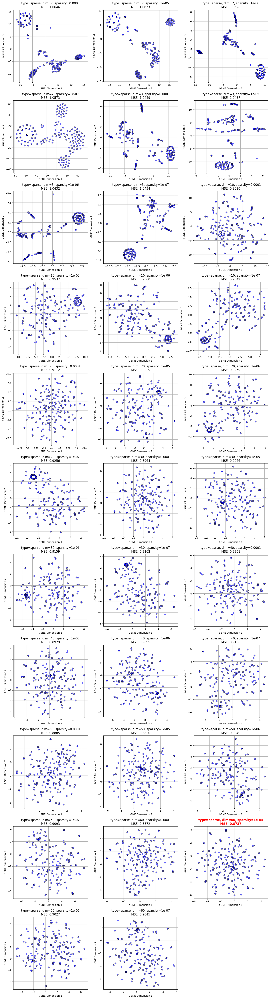

Running Autoencoder with type=denoising, encoding_dim=2, parameter=0.1
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Saved latent space to Autoencoders_2/autoencoder_typedenoising_dim2_param0.1_error1.0557.csv
Running Autoencoder with type=denoising, encoding_dim=2, parameter=0.2
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Saved latent space to Autoencoders_2/autoencoder_typedenoising_dim2_param0.2_error1.0549.csv
Running Autoencoder with type=denoising, encoding_dim=2, parameter=0.3
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Saved latent space to Autoencoders_2/autoencoder_typedenoising_dim2_param0.3_error1.0528.csv
Running Autoencoder with type=denoising, encoding_dim=2, parameter=0.4
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Saved latent space to Autoencoders_2/autoencoder_typedenoising_dim2_param0.4_error1.0532.csv
Running Autoencoder with type=denoising,

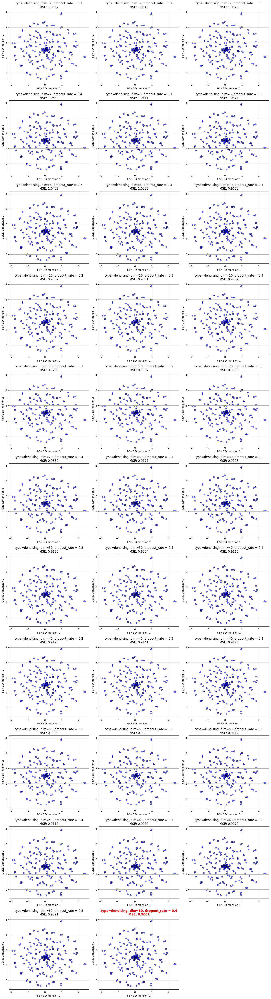

In [ ]:
param_grid_sparse = {
    'type': ['sparse'],
    'encoding_dim': [2, 3, 10, 20, 30, 40, 50, 60],
    'sparsity': [1e-4, 1e-5, 1e-6, 1e-7]  # Only used for sparse autoencoder
}

param_grid_denoising = {
    'type': ['denoising'],
    'encoding_dim': [2, 3, 10, 20, 30, 40, 50, 60],
    'dropout_rate': [0.1, 0.2, 0.3, 0.4]  # Only used for denoising autoencoder
}

# Run the function
results_sparse = run_autoencoders_with_tsne(X, param_grid_sparse, first_column)
results_denoising = run_autoencoders_with_tsne(X, param_grid_denoising, first_column)


Running UMAP with n_components=2, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh20_mindist0.1_metriceuclidean_error2158.6558.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh20_mindist0.1_metriccosine_error2098.1799.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh20_mindist0.3_metriceuclidean_error2132.3396.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh20_mindist0.3_metriccosine_error2069.0803.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh20_mindist0.7_metriceuclidean_error2085.4247.csv
Running UMAP with n_components=2, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh20_mindist0.7_metriccosine_error2009.5221.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh40_mindist0.1_metriceuclidean_error2161.7409.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh40_mindist0.1_metriccosine_error2121.8083.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh40_mindist0.3_metriceuclidean_error2136.2569.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh40_mindist0.3_metriccosine_error2090.6026.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh40_mindist0.7_metriceuclidean_error2089.8799.csv
Running UMAP with n_components=2, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh40_mindist0.7_metriccosine_error2034.8407.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh60_mindist0.1_metriceuclidean_error2161.1448.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh60_mindist0.1_metriccosine_error2131.0110.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh60_mindist0.3_metriceuclidean_error2138.9231.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh60_mindist0.3_metriccosine_error2101.2291.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh60_mindist0.7_metriceuclidean_error2085.3119.csv
Running UMAP with n_components=2, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp2_nneigh60_mindist0.7_metriccosine_error2047.1805.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh20_mindist0.1_metriceuclidean_error2169.7496.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh20_mindist0.1_metriccosine_error2125.6495.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh20_mindist0.3_metriceuclidean_error2144.9610.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh20_mindist0.3_metriccosine_error2097.0718.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh20_mindist0.7_metriceuclidean_error2099.9443.csv
Running UMAP with n_components=3, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh20_mindist0.7_metriccosine_error2046.8645.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh40_mindist0.1_metriceuclidean_error2170.1988.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh40_mindist0.1_metriccosine_error2141.5484.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh40_mindist0.3_metriceuclidean_error2148.2951.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh40_mindist0.3_metriccosine_error2115.7573.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh40_mindist0.7_metriceuclidean_error2102.7668.csv
Running UMAP with n_components=3, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh40_mindist0.7_metriccosine_error2063.9527.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh60_mindist0.1_metriceuclidean_error2172.3415.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh60_mindist0.1_metriccosine_error2149.0678.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh60_mindist0.3_metriceuclidean_error2147.4383.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh60_mindist0.3_metriccosine_error2123.8550.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh60_mindist0.7_metriceuclidean_error2101.6864.csv
Running UMAP with n_components=3, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp3_nneigh60_mindist0.7_metriccosine_error2072.6472.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh20_mindist0.1_metriceuclidean_error2177.1667.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh20_mindist0.1_metriccosine_error2137.7721.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh20_mindist0.3_metriceuclidean_error2155.7292.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh20_mindist0.3_metriccosine_error2116.7830.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh20_mindist0.7_metriceuclidean_error2115.4368.csv
Running UMAP with n_components=5, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh20_mindist0.7_metriccosine_error2074.3453.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh40_mindist0.1_metriceuclidean_error2179.6067.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh40_mindist0.1_metriccosine_error2154.4912.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh40_mindist0.3_metriceuclidean_error2158.6043.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh40_mindist0.3_metriccosine_error2132.3729.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh40_mindist0.7_metriceuclidean_error2118.2884.csv
Running UMAP with n_components=5, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh40_mindist0.7_metriccosine_error2088.4803.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh60_mindist0.1_metriceuclidean_error2179.7209.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh60_mindist0.1_metriccosine_error2162.2129.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh60_mindist0.3_metriceuclidean_error2157.9279.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh60_mindist0.3_metriccosine_error2140.2844.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh60_mindist0.7_metriceuclidean_error2118.2434.csv
Running UMAP with n_components=5, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp5_nneigh60_mindist0.7_metriccosine_error2096.6379.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh20_mindist0.1_metriceuclidean_error2183.4845.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh20_mindist0.1_metriccosine_error2139.2816.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh20_mindist0.3_metriceuclidean_error2163.4549.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh20_mindist0.3_metriccosine_error2122.0410.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh20_mindist0.7_metriceuclidean_error2124.6640.csv
Running UMAP with n_components=10, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh20_mindist0.7_metriccosine_error2085.6649.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh40_mindist0.1_metriceuclidean_error2184.9785.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh40_mindist0.1_metriccosine_error2157.2168.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh40_mindist0.3_metriceuclidean_error2164.9530.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh40_mindist0.3_metriccosine_error2137.7346.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh40_mindist0.7_metriceuclidean_error2126.5772.csv
Running UMAP with n_components=10, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh40_mindist0.7_metriccosine_error2099.7213.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh60_mindist0.1_metriceuclidean_error2185.9144.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh60_mindist0.1_metriccosine_error2165.8389.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh60_mindist0.3_metriceuclidean_error2165.3944.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh60_mindist0.3_metriccosine_error2145.6676.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh60_mindist0.7_metriceuclidean_error2126.8112.csv
Running UMAP with n_components=10, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp10_nneigh60_mindist0.7_metriccosine_error2106.7982.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh20_mindist0.1_metriceuclidean_error2184.7131.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh20_mindist0.1_metriccosine_error2139.4611.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh20_mindist0.3_metriceuclidean_error2165.2985.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh20_mindist0.3_metriccosine_error2122.6588.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh20_mindist0.7_metriceuclidean_error2127.6026.csv
Running UMAP with n_components=20, n_neighbors=20, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh20_mindist0.7_metriccosine_error2086.8589.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh40_mindist0.1_metriceuclidean_error2186.8938.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh40_mindist0.1_metriccosine_error2156.8783.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh40_mindist0.3_metriceuclidean_error2167.1615.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh40_mindist0.3_metriccosine_error2138.0034.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh40_mindist0.7_metriceuclidean_error2129.3833.csv
Running UMAP with n_components=20, n_neighbors=40, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh40_mindist0.7_metriccosine_error2101.2260.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.1, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh60_mindist0.1_metriceuclidean_error2187.3772.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.1, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh60_mindist0.1_metriccosine_error2166.3002.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.3, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh60_mindist0.3_metriceuclidean_error2167.6211.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.3, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh60_mindist0.3_metriccosine_error2146.5823.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.7, metric=euclidean


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh60_mindist0.7_metriceuclidean_error2129.8758.csv
Running UMAP with n_components=20, n_neighbors=60, min_dist=0.7, metric=cosine


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Saved Umap result to Umap_2/umap_ncomp20_nneigh60_mindist0.7_metriccosine_error2109.1060.csv


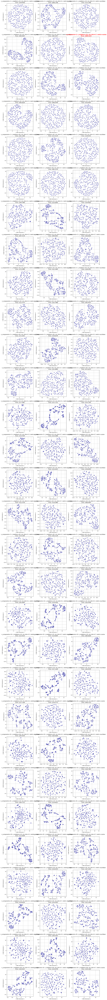

In [ ]:
# Example of how to call the function with a parameter grid
param_grid = {
    'n_components': [2, 3, 5, 10, 20],
    'n_neighbors': [20, 40, 60],
    'min_dist': [0.1, 0.3, 0.7],
    'metric': ['euclidean', 'cosine']
}

# Run the function
results = run_umap_with_tsne(X, param_grid, first_column)


In [ ]:
# prompt: zip my three folders Autoencoders, Isomap and Umap into a single zip file but keep each folder

import shutil
import os

def zip_folders(folder_names, zip_file_name):
  """Zips multiple folders into a single zip file, preserving folder structure."""
  import zipfile

  try:
    with zipfile.ZipFile(zip_file_name, 'w', zipfile.ZIP_DEFLATED) as zipf:
      for folder_name in folder_names:
        for root, _, files in os.walk(folder_name):
          for file in files:
            file_path = os.path.join(root, file)
            arcname = os.path.relpath(file_path, os.path.dirname(folder_name)) # Preserve folder structure
            zipf.write(file_path, arcname=arcname)
    print(f"Successfully zipped folders into '{zip_file_name}'")

  except FileNotFoundError:
    print(f"One or more folders not found.")
  except Exception as e:
    print(f"An error occurred: {e}")


# Example usage
folder_names = ["Autoencoders", "Isomap", "Umap", "Autoencoders_2", "Isomap_2", "Umap_2"]  # Replace with your actual folder names
zip_file_name = "dimensionality_reduction_results.zip"
zip_folders(folder_names, zip_file_name)


Successfully zipped folders into 'dimensionality_reduction_results.zip'
